# (30) fit — iterative pvae

**Motivation**: host = ```mach```, device = ```cuda:1``` <br>

In [1]:
# HIDE CODE


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-vae/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-vae/figs')
tmp_dir = os.path.join(git_dir, 'jb-vae/tmp')

# GitHub
# sys.path.insert(0, os.path.join(git_dir, '_PoissonVAE'))
sys.path.insert(0, os.path.join(git_dir, '_IterativeVAE'))
from figures.fighelper import *
from vae.train_vae import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
from base.utils_model import load_quick

device_idx = 1
device = f'cuda:{device_idx}'

## vH16

### Get configs

In [3]:
model_type = 'poisson'
cfg_vae, cfg_tr = default_configs('MNIST', model_type, 'conv+b|deconv')

cfg_vae['n_latents'] = [128]
cfg_vae['init_scale'] = 1e-2
cfg_vae['seq_len'] = 5

cfg_tr['lr'] = 2e-3
cfg_tr['epochs'] = 100
cfg_tr['batch_size'] = 60
cfg_tr['kl_beta'] = 3.0
cfg_tr['kl_balancer'] = None

print(f"VAE:\n{cfg_vae}\n\nTrainer:\n{cfg_tr}")

VAE:
{'dataset': 'MNIST', 'n_latents': [128], 'prior_clamp': -2, 'enc_type': 'conv', 'dec_type': 'deconv', 'enc_bias': 
True, 'dec_bias': False, 'init_dist': 't', 'init_scale': 0.01, 'seq_len': 5}

Trainer:
{'epochs': 100, 'batch_size': 60, 'warm_restart': 2, 'optimizer_kws': {'weight_decay': 0.0003}, 'grad_clip': 1000, 
'kl_const_portion': 0.01, 'lr': 0.002, 'kl_beta': 3.0, 'kl_balancer': None}

### Make model + trainer

In [4]:
vae = HIPVAE(CFG_CLASSES[model_type](**cfg_vae))
tr = TrainerVAE(vae, ConfigTrainVAE(**cfg_tr), device=device)

+-------------+------------+
| Module Name | Num Params |
+-------------+------------+
|    HIPVAE   |  3.9 Mil   |
|     ———     |    ———     |
|  layers.L_0 |  3.9 Mil   |
+-------------+------------+

poisson_uniform_c(-2)_MNIST_t-5_z-[128]_k-32_<conv+b|deconv>
mc_b60-ep100-lr(0.002)_beta(3:0x0.5)_temp(0.05:lin-0.5)_gr(1000)_(2024_09_02,22:06)

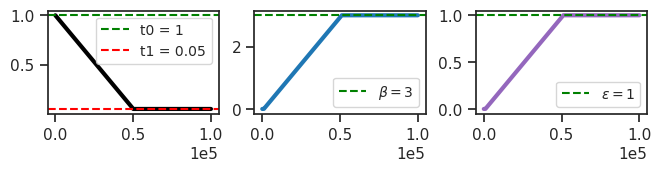

In [5]:
vae.print()
print(f"{vae.cfg.name()}\n{tr.cfg.name()}_({vae.timestamp})\n")
tr.show_schedules()

In [6]:
self = tr.model.input_layer

In [7]:
print(self.dec)

Sequential(
  (0): UnFlatten()
  (1): ConvTranspose2d(128, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
  (2): SiLU(inplace=True)
  (3): ConvTranspose2d(64, 32, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2))
  (4): SiLU(inplace=True)
  (5): ConvTranspose2d(32, 16, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2))
  (6): SiLU(inplace=True)
  (7): ConvTranspose2d(16, 1, kernel_size=(1, 1), stride=(1, 1))
)

### Fit model

In [8]:
tr.cfg.kl_balancer

In [9]:
tr.train()  #fitname=f"dMSE_+Bias_bal-{tr.cfg.kl_balancer}_{tr.cfg.name()}")

epoch # 100, avg loss: 17.520442: 100%|████████████████████████████████████████████████████████| 100/100 [2:08:59<00:00, 77.40s/it]


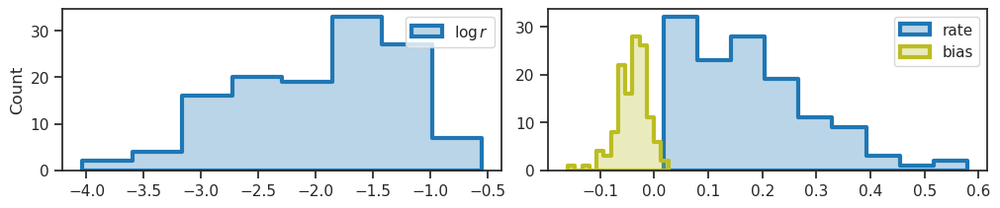

In [10]:
log_rate = tonp(tr.model.input_layer.log_rate).ravel()
bias = tonp(tr.model.input_layer.bias).ravel()

fig, axes = create_figure(1, 2, (10, 2))
kws = dict(fill=True, lw=3, alpha=0.3, ax=axes[0])
sns.histplot(log_rate, color='C0', element='step', label=r'$\log r$', **kws)

kws = dict(fill=True, lw=3, alpha=0.3, ax=axes[1])
sns.histplot(np.exp(log_rate), color='C0', element='step', label='rate', **kws)
sns.histplot(bias, color='C8', element='step', label='bias', **kws)

axes[1].set(ylabel='')
add_legend(axes)

plt.show()

In [11]:
data, loss, etc = tr.validate(full_data=True)
kl_diag = loss['kl_diag'].copy()
loss = {
    k: np.mean(v, 0) for k, v in
    loss.items() if k != 'kl_diag'
}
print(loss)

{
    'kl': array([10.352147 ,  1.9005843,  1.0816576,  0.5764189,  0.3553233],
      dtype=float32),
    'recon': array([25.930927, 16.874664, 13.216349, 11.608067, 10.637946],
      dtype=float32),
    'nelbo': array([36.28311 , 18.77526 , 14.297981, 12.184511, 10.993251],
      dtype=float32)
}

In [12]:
results = tr.analysis(3000, verbose=True)

100%|███████████████████████████████| 167/167 [27:38<00:00,  9.93s/it]
/home/hadi/anaconda3/lib/python3.11/site-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)


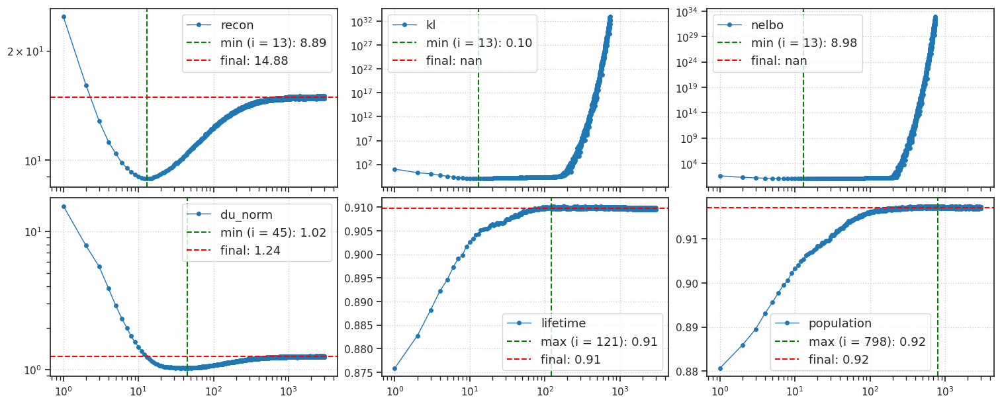

In [13]:
from figures.analysis import plot_convergence
plot_convergence(results)

In [14]:
self = tr.model.input_layer
self.reset_state(64)

dist, z, pred = self.generate(0.0)

output = tr.model.generate(pred, seq=range(300))
output = output.stack()

loss_kl = tonp(torch.sum(output['loss_kl'], -1))
u = tr.model.input_layer.log_rate.expand(len(pred), -1)
desc_len = tr.model.input_layer.loss_kl(u=u)
desc_len = tonp(torch.sum(desc_len, dim=-1))

list(output)

['recon', 'ff', 'fb', 'spks', 'dist', 'loss_kl', 'loss_recon']

In [15]:
shape = (tr.model.cfg.input_sz, tr.model.cfg.input_sz)

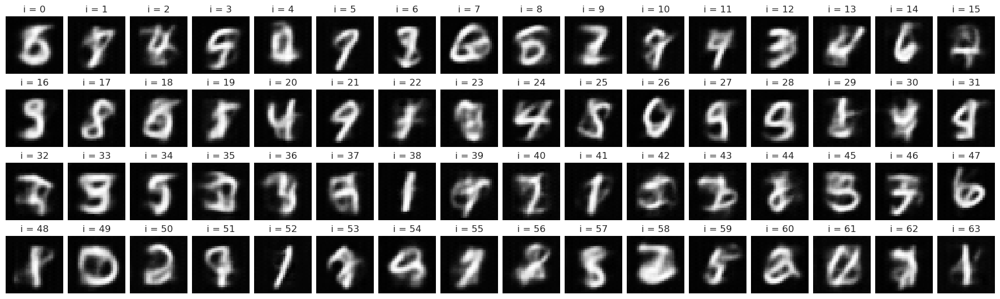

In [16]:
nrows = 4
ncols = int(np.ceil(len(pred) / nrows))
fig, axes = create_figure(nrows, ncols, (1.1 * ncols, 1.3 * nrows), 'all', 'all')
for sample_i, ax in enumerate(axes.flat):
    i, j = sample_i // ncols, sample_i % ncols
    x2p = tonp(pred[sample_i].reshape(shape))
    ax.imshow(x2p, cmap='Greys_r')
    ax.set_title(f"i = {sample_i}")
trim_axs(axes, len(pred))
remove_ticks(axes)
plt.show()

In [17]:
sample_i = 30

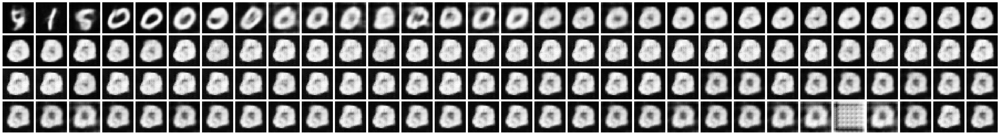

In [18]:
nrows, ncols = 4, 30
fig, axes = create_figure(nrows, ncols, (1.3 * ncols, 1.3 * nrows), 'all', 'all')
for idx, ax in enumerate(axes.flat):
    i, j = idx // ncols, idx % ncols
    x2p = tonp(output['recon'][sample_i, idx].reshape(shape))
    ax.imshow(x2p, cmap='Greys_r')
remove_ticks(axes)

In [19]:
order = np.argsort(desc_len)

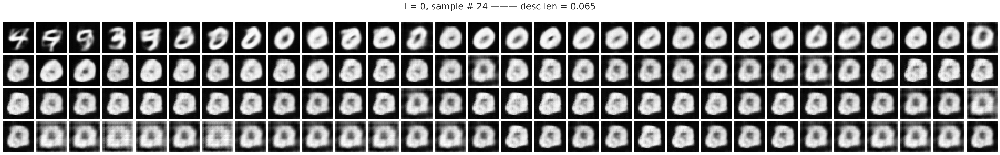

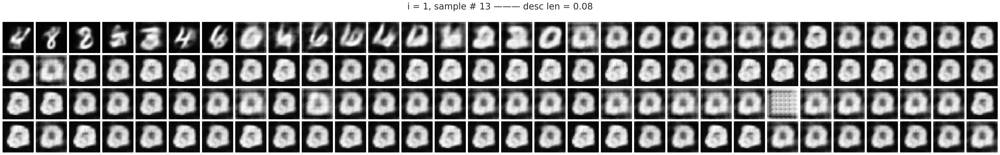

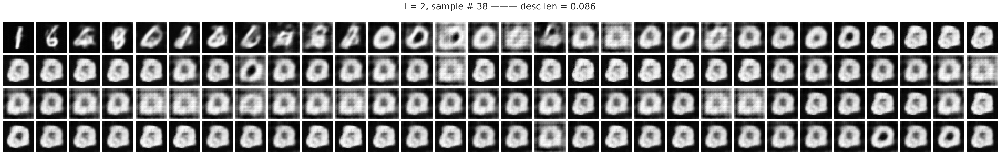

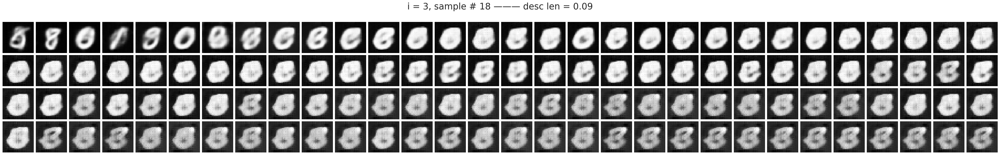

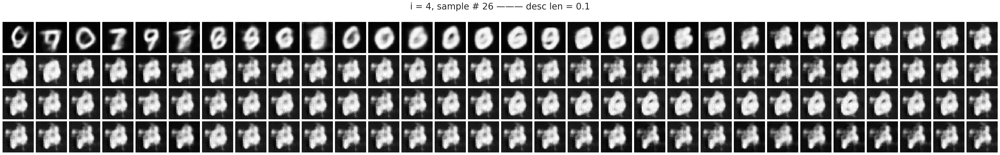

...

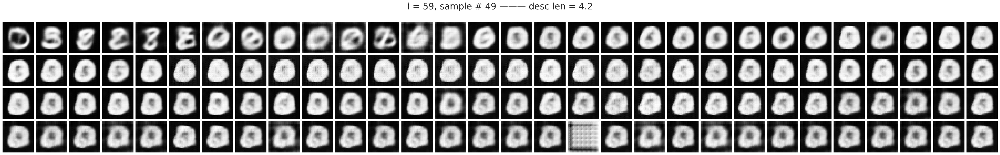

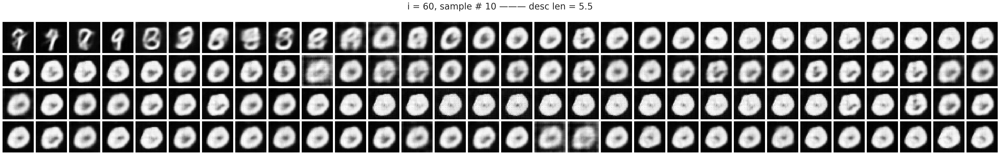

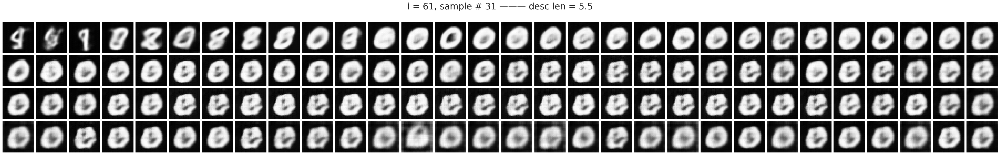

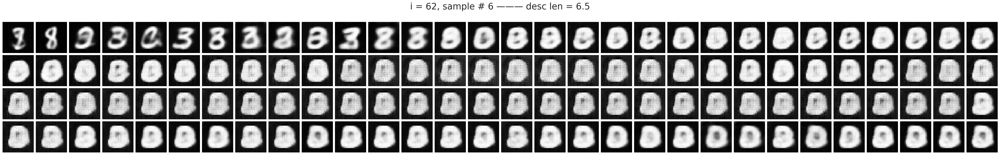

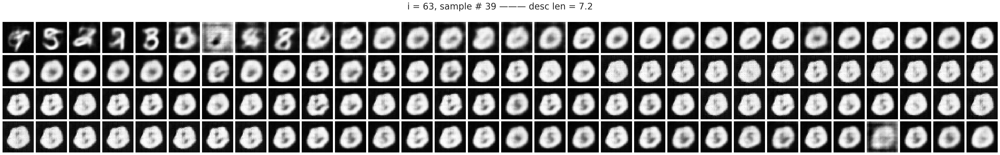

In [20]:
for i in range(len(pred)):
    sample_i = order[i]
    nrows, ncols = 4, 30
    fig, axes = create_figure(nrows, ncols, (1.3 * ncols, 1.3 * nrows), 'all', 'all')
    tit = ' ——— '.join([
        f"i = {i}, sample # {sample_i}",
        f"desc len = {desc_len[sample_i]:0.2g}",
    ])
    fig.suptitle(tit, fontsize=25, y=1.14)
    
    x2p = tonp(pred[sample_i].reshape(shape))
    axes[0, 0].imshow(x2p, cmap='Greys_r')
    
    for idx, ax in enumerate(axes.flat[1:], start=1):
        i, j = idx // ncols, idx % ncols
        x2p = tonp(output['recon'][sample_i, idx - 1].reshape(28, 28))
        ax.imshow(x2p, cmap='Greys_r')
    remove_ticks(axes)
    plt.show()